## Load libraries

In [1]:
# Libraries to work cross-platform
import os

# Libraries to work with dataset
import numpy as np
import pandas as pd
import ast                      # convert string to list after importing csv data
# import tmtoolkit
import pickle

# Libraries to cluster data
# from gsdmm import MovieGroupProcess
# from gsdmm import MovieGroupProcess_v2 as MovieGroupProcess
from gensim.corpora import Dictionary

# Libraries to visualize data
import matplotlib.pyplot as plt
import seaborn as sns
from cluster_visualization_helper import (
    visualize_cluster  # user-defined functions
)
from pprint import pprint

# Libraries for evaluation
from sklearn import metrics
# import compute_topic_coherence
from gensim.models import CoherenceModel

# Libraries for monitoring operation process
from tqdm.notebook import tqdm
from datetime import datetime
# import warnings

In [2]:
from numpy import argmax, exp, log
from numpy.random import multinomial

# import json
# from tqdm.notebook import tqdm


class MovieGroupProcess:
    def __init__(self, K=8, alpha=0.1, beta=0.1, n_iters=30):
        """
        A MovieGroupProcess is a conceptual model introduced by Yin and Wang 2014 to
        describe their Gibbs sampling algorithm for a Dirichlet Mixture Model for the
        clustering short text documents.
        Reference: http://dbgroup.cs.tsinghua.edu.cn/wangjy/papers/KDD14-GSDMM.pdf

        Imagine a professor is leading a film class. At the start of the class, the students
        are randomly assigned to K tables. Before class begins, the students make lists of
        their favorite films. The teacher reads the role n_iters times. When
        a student is called, the student must select a new table satisfying either:
            1) The new table has more students than the current table.
        OR
            2) The new table has students with similar lists of favorite movies.

        :param K: int
            Upper bound on the number of possible clusters. Typically many fewer
        :param alpha: float between 0 and 1
            Alpha controls the probability that a student will join a table that is currently empty
            When alpha is 0, no one will join an empty table.
        :param beta: float between 0 and 1
            Beta controls the student's affinity for other students with similar interests. A low beta means
            that students desire to sit with students of similar interests. A high beta means they are less
            concerned with affinity and are more influenced by the popularity of a table
        :param n_iters:
        """
        self.K = K
        self.alpha = alpha
        self.beta = beta
        self.n_iters = n_iters

        # slots for computed variables
        self.number_docs = None
        self.vocab_size = None
        self.cluster_doc_count = [0 for _ in range(K)]
        self.cluster_word_count = [0 for _ in range(K)]
        self.cluster_word_distribution = [{} for i in range(K)]

    @staticmethod
    def from_data(
        K,
        alpha,
        beta,
        D,
        vocab_size,
        cluster_doc_count,
        cluster_word_count,
        cluster_word_distribution,
    ):
        """
        Reconstitute a MovieGroupProcess from previously fit data
        :param K:
        :param alpha:
        :param beta:
        :param D:
        :param vocab_size:
        :param cluster_doc_count:
        :param cluster_word_count:
        :param cluster_word_distribution:
        :return:
        """
        mgp = MovieGroupProcess_v2(K, alpha, beta, n_iters=30)
        mgp.number_docs = D
        mgp.vocab_size = vocab_size
        mgp.cluster_doc_count = cluster_doc_count
        mgp.cluster_word_count = cluster_word_count
        mgp.cluster_word_distribution = cluster_word_distribution
        return mgp

    @staticmethod
    def _sample(p):
        """
        Sample with probability vector p from a multinomial distribution
        :param p: list
            List of probabilities representing probability vector for the multinomial distribution
        :return: int
            index of randomly selected output
        """
        return [i for i, entry in enumerate(multinomial(1, p)) if entry != 0][0]

    def fit(self, docs, vocab_size):
        """
        Cluster the input documents
        :param docs: list of list
            list of lists containing the unique token set of each document
        :param V: total vocabulary size for each document
        :return: list of length len(doc)
            cluster label for each document
        """
        alpha, beta, K, n_iters, V = (
            self.alpha,
            self.beta,
            self.K,
            self.n_iters,
            vocab_size,
        )

        D = len(docs)
        self.number_docs = D
        self.vocab_size = vocab_size

        # unpack to easy var names
        m_z, n_z, n_z_w = (
            self.cluster_doc_count,
            self.cluster_word_count,
            self.cluster_word_distribution,
        )
        cluster_count = K
        d_z = [None for i in range(len(docs))]

        # initialize the clusters
        for i, doc in tqdm(
            iterable=enumerate(docs), total=len(docs), desc="Sampling documents"
        ):

            # choose a random  initial cluster for the doc
            z = self._sample([1.0 / K for _ in range(K)])
            d_z[i] = z
            m_z[z] += 1
            n_z[z] += len(doc)

            for word in doc:
                if word not in n_z_w[z]:
                    n_z_w[z][word] = 0
                n_z_w[z][word] += 1

        iter_result = {
            "n_iters": [],
            "max_topics": [],
            "alpha": [],
            "beta": [],
            "iter": [],
            "transferred_clusters": [],
            "populated_clusters": [],
        }

        for _iter in tqdm(iterable=range(n_iters), total=n_iters, desc="Iteration"):
            total_transfers = 0

            for i, doc in tqdm(
                iterable=enumerate(docs), total=len(docs), desc="Transfering docs"
            ):

                # remove the doc from it's current cluster
                z_old = d_z[i]

                m_z[z_old] -= 1
                n_z[z_old] -= len(doc)

                for word in doc:
                    n_z_w[z_old][word] -= 1

                    # compact dictionary to save space
                    if n_z_w[z_old][word] == 0:
                        del n_z_w[z_old][word]

                # draw sample from distribution to find new cluster
                p = self.score(doc)
                z_new = self._sample(p)

                # transfer doc to the new cluster
                if z_new != z_old:
                    total_transfers += 1

                d_z[i] = z_new
                m_z[z_new] += 1
                n_z[z_new] += len(doc)

                for word in doc:
                    if word not in n_z_w[z_new]:
                        n_z_w[z_new][word] = 0
                    n_z_w[z_new][word] += 1

            cluster_count_new = sum([1 for v in m_z if v > 0])
            print(
                "In stage %d: transferred %d clusters with %d clusters populated"
                % (_iter, total_transfers, cluster_count_new)
            )

            iter_result["n_iters"].append(n_iters)
            iter_result["max_topics"].append(K)
            iter_result["alpha"].append(alpha)
            iter_result["beta"].append(beta)
            iter_result["iter"].append(_iter)
            iter_result["transferred_clusters"].append(total_transfers)
            iter_result["populated_clusters"].append(cluster_count_new)

            if (
                total_transfers == 0
                and cluster_count_new == cluster_count
                and _iter > 25
            ):
                print("Converged.  Breaking out.")
                break
            cluster_count = cluster_count_new
        self.cluster_word_distribution = n_z_w

        # d_z = cluster label for each document,
        # m_z = cluster_doc_count,
        # n_z = cluster_word_count,
        # n_z_w = cluster_word_distribution
        return d_z, m_z, n_z, n_z_w, cluster_count, iter_result

    def score(self, doc):
        """
        Score a document

        Implements formula (3) of Yin and Wang 2014.
        http://dbgroup.cs.tsinghua.edu.cn/wangjy/papers/KDD14-GSDMM.pdf

        :param doc: list[str]: The doc token stream
        :return: list[float]: A length K probability vector where each component represents
                              the probability of the document appearing in a particular cluster
        """
        alpha, beta, K, V, D = (
            self.alpha,
            self.beta,
            self.K,
            self.vocab_size,
            self.number_docs,
        )
        m_z, n_z, n_z_w = (
            self.cluster_doc_count,
            self.cluster_word_count,
            self.cluster_word_distribution,
        )

        p = [0 for _ in range(K)]

        #  We break the formula into the following pieces
        #  p = N1*N2/(D1*D2) = exp(lN1 - lD1 + lN2 - lD2)
        #  lN1 = log(m_z[z] + alpha)
        #  lN2 = log(D - 1 + K*alpha)
        #  lN2 = log(product(n_z_w[w] + beta)) = sum(log(n_z_w[w] + beta))
        #  lD2 = log(product(n_z[d] + V*beta + i -1)) = sum(log(n_z[d] + V*beta + i -1))

        lD1 = log(D - 1 + K * alpha)
        doc_size = len(doc)
        for label in range(K):
            lN1 = log(m_z[label] + alpha)
            lN2 = 0
            lD2 = 0
            for word in doc:
                lN2 += log(n_z_w[label].get(word, 0) + beta)
            for j in range(1, doc_size + 1):
                lD2 += log(n_z[label] + V * beta + j - 1)
            p[label] = exp(lN1 - lD1 + lN2 - lD2)

        # normalize the probability vector
        pnorm = sum(p)
        pnorm = pnorm if pnorm > 0 else 1
        return [pp / pnorm for pp in p]

    def choose_best_label(self, doc):
        """
        Choose the highest probability label for the input document
        :param doc: list[str]: The doc token stream
        :return:
        """
        p = self.score(doc)
        return argmax(p), max(p)

## Configurate and declare global variables

In [3]:
try:
    username = os.environ['HOSTNAME']
except:
    username = os.environ['COMPUTERNAME']

n_cpu = os.cpu_count()

os_name = os.name
username, n_cpu, os_name

('PINKA-ASUS-VIVO', 8, 'nt')

In [4]:
if os_name == 'nt':
    """Windows platform"""
    BASE_DIR = "E:/THIENDHB_GOOGLEDRIVE/MASTER TILBURG/THESIS/"
    INPUT_DIR = BASE_DIR + "DATASET/INPUT/"
    OUTPUT_DIR = BASE_DIR + "DATASET/OUTPUT/"
    RESULT_DIR = BASE_DIR + "RESULTS/"

elif os_name == 'posix' and n_cpu < 4:
    """Linux platform"""
    if username == 'PinkaLinux':
        """Local env"""
        BASE_DIR = "/media/pinkalinux/WORK/THIENDHB_GOOGLEDRIVE/MASTER TILBURG/THESIS/"
    elif n_cpu == 2:
        """Google Colab"""
        from google.colab import drive
        drive.mount('/content/drive', force_remount=True)
        BASE_DIR = "/content/drive/MyDrive/MASTER TILBURG/THESIS/"

    INPUT_DIR = BASE_DIR + "DATASET/INPUT/"
    OUTPUT_DIR = BASE_DIR + "DATASET/OUTPUT/"
    RESULT_DIR = BASE_DIR + "RESULTS/"

else:
    """Kaggle notebook"""
    BASE_DIR = "../input/dssthesis/"
    INPUT_DIR = BASE_DIR
    OUTPUT_DIR = "../working/"
    RESULT_DIR = OUTPUT_DIR + 'RESULTS/'
    if os.path.exists(RESULT_DIR) is False:
        os.mkdir(RESULT_DIR)
        print('Making dir', RESULT_DIR)
    else:
        print(RESULT_DIR, 'exists!')

SEED = 6886

%matplotlib inline

## Import data

In [5]:
# Load title embeddings
title_embeddings = np.load(OUTPUT_DIR + "title_embeddings.npy")

# Load clean job title dataset from file
title_docs = pd.read_csv(
    OUTPUT_DIR + "clean_title_df.csv",
    converters={
        "job_title_token": ast.literal_eval,
    },
    dtype={
        "job_id": int,
        "job_title": str,
        "job_title_lemma": str,
    }
)

In [6]:
title_embeddings.shape, title_docs.shape

((18992, 300), (18992, 4))

In [7]:
title_docs

,job_id,job_title,job_title_lemma,job_title_token
0,1,Chief Financial Officer,chief financial officer,"[chief, financial, officer]"
1,2,Full-time Community Connections Intern (paid i...,time community connection intern pay internship,"[time, community, connection, intern, pay, int..."
2,3,Country Coordinator,country coordinator,"[country, coordinator]"
3,4,BCC Specialist,bcc specialist,"[bcc, specialist]"
4,5,Software Developer,software developer,"[software, developer]"
...,...,...,...,...
18987,18997,Senior Creative UX/ UI Designer,senior creative ux ui designer,"[senior, creative, ux, ui, designer]"
18988,18998,Category Development Manager,category development manager,"[category, development, manager]"
18989,18999,Operational Marketing Manager,operational marketing manager,"[operational, marketing, manager]"
18990,19000,Head of Online Sales Department,head online sale department,"[head, online, sale, department]"


## Clustering data

### Gibbs Sampling Dirichlet Mixture Model (GSDMM)

In [8]:
# Create doc list of clean job titles
doc_list = title_docs["job_title_lemma"].values.tolist()
pprint(doc_list[:10])

# Create corpus (list of tokens per document)
title_corpus = title_docs["job_title_token"].values.tolist()
pprint(title_corpus[:10])

# Create Dictionary
id2word = Dictionary(title_corpus)

# # Term Document Frequency
model_corpus = [id2word.doc2bow(text) for text in title_corpus]
pprint(model_corpus[:3])

['chief financial officer',
 'time community connection intern pay internship',
 'country coordinator',
 'bcc specialist',
 'software developer',
 'saleswoman',
 'chief accountant finance assistant',
 'non pay time programmatic intern',
 'assistant manage director',
 'program assistant inl fsn fp']
[['chief', 'financial', 'officer'],
 ['time', 'community', 'connection', 'intern', 'pay', 'internship'],
 ['country', 'coordinator'],
 ['bcc', 'specialist'],
 ['software', 'developer'],
 ['saleswoman'],
 ['chief', 'accountant', 'finance', 'assistant'],
 ['non', 'pay', 'time', 'programmatic', 'intern'],
 ['assistant', 'manage', 'director'],
 ['program', 'assistant', 'inl', 'fsn', 'fp']]
[[(0, 1), (1, 1), (2, 1)],
 [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1)],
 [(9, 1), (10, 1)]]


In [9]:
# title_corpus = title_docs["clean_job_title"].values.tolist()
# len(title_corpus), list(title_corpus)[:10]

In [10]:
# title_vocab = set(tmtoolkit.utils.flatten_list(title_corpus))
title_vocab = set([word for sublist in title_corpus for word in sublist])
len(title_vocab), list(title_vocab)[:10]

(2579,
 ['lobby',
  'operational',
  'distribute',
  'director',
  'tshambarak',
  'prosperity',
  'sysytem',
  'microsoft',
  'retail',
  'cheef'])

In [11]:
def build_mgp_model(
    X,
    corpus,
    vocab_size,
    K=100,
    alpha=0.1,
    beta=0.1,
    n_iters=50,
    seed=6886,
):
    """
    A MovieGroupProcess is a conceptual model introduced by Yin and Wang 2014 to
    describe their Gibbs sampling algorithm for a Dirichlet Mixture Model for the
    clustering short text documents.
    Reference: http://dbgroup.cs.tsinghua.edu.cn/wangjy/papers/KDD14-GSDMM.pdf
    Imagine a professor is leading a film class. At the start of the class, the students
    are randomly assigned to K tables. Before class begins, the students make lists of
    their favorite films. The teacher reads the role n_iters times. When
    a student is called, the student must select a new table satisfying either:
        1) The new table has more students than the current table.
    OR
        2) The new table has students with similar lists of favorite movies.

    :param K: int
        Upper bound on the number of possible clusters. Typically many fewer
    :param alpha: float between 0 and 1
        Alpha controls the probability that a student will join a table that is currently empty
        When alpha is 0, no one will join an empty table.
    :param beta: float between 0 and 1
        Beta controls the student's affinity for other students with similar interests. A low beta means
        that students desire to sit with students of similar interests. A high beta means they are less
        concerned with affinity and are more influenced by the popularity of a table
    """
    np.random.seed(SEED)
    mgp = MovieGroupProcess(K=K, alpha=alpha, beta=beta, n_iters=n_iters)

    """
        MovieGroupProcess().fit: Cluster the input documents
        :param docs: list of list
            list of lists containing the unique token set of each document
        :param V: total vocabulary size for each document
        :return:
            # d_z = cluster label for each document,
            # m_z = cluster_doc_count,
            # n_z = cluster_word_count,
            # n_z_w = cluster_word_distribution
            # cluster_count = number of clusters found
    """
    #     mgp_labels = mgp.fit(docs=corpus, vocab_size=vocab_size)
    d_z, m_z, n_z, n_z_w, cluster_count, iter_result = mgp.fit(
        docs=corpus, vocab_size=vocab_size
    )

    return mgp, d_z, m_z, n_z, n_z_w, cluster_count, iter_result

## Tuning hyperparameters

In [12]:
# Preparing hyperparameters for tuning
n_iters = 5
# n_iters = 2

# Topics range
topic_range = [200]

# Alpha parameter
alpha_range = [0.001, 0.5]
# alpha_range = [0.001]

# Beta parameter
beta_range = [0.001, 0.5]
# beta_range = [0.001]

tuning_result = {
    "n_iters": [],
    "max_topics": [],
    "alpha": [],
    "beta": [],
    "duration": [],
    "n_clusters": [],
}

model_list = []
label_list = []
topics_list = []
iter_result_list = []
distribution_dict = {
    "n_iters": [],
    "max_topics": [],
    "alpha": [],
    "beta": [],
    "m_z": [],
    "n_z": [],
    "n_z_w": [],
}
# m_z = cluster_doc_count,
# n_z = cluster_word_count,
# n_z_w = cluster_word_distribution
# cluster_count = number of clusters found

In [13]:
# len(corpus_sets) * len(topics_range) * len(alpha) * len(beta)
print(topic_range)
print(alpha_range)
print(beta_range)
print(
    len(topic_range),
    len(alpha_range),
    len(beta_range),
    len(topic_range) * len(alpha_range) * len(beta_range),
)

[200]
[0.001, 0.5]
[0.001, 0.5]
1 2 2 4


In [14]:
# Tuning GSDMM to find optimal number of topics
pbar = tqdm(
#     iterable=topic_range,
    desc="GSDMM tuning",
    total=len(topic_range) #* len(alpha_range) * len(beta_range),
)

# iterate through number of topics
for max_topics in topic_range:
    # iterate through alpha values
    for alpha in alpha_range:
        # iterare through beta values
        for beta in beta_range:

            # Train model
            starttime = datetime.now()
            print("Start", starttime.strftime("%Y-%m-%d %H:%M:%S.%f"))
            print("max_topics =", max_topics)
            print("n_iters =", n_iters)
            print("alpha =", alpha)
            print("beta =", beta)

            (
                clusterer,
                labels,
                m_z,
                n_z,
                n_z_w,
                n_clusters,
                iter_result,
            ) = build_mgp_model(
                X=title_docs,
                corpus=title_corpus,
                vocab_size=len(title_vocab),
                K=max_topics,
                alpha=alpha,
                beta=beta,
                n_iters=n_iters,
                seed=SEED,
            )

            endtime = datetime.now()
            print("End", endtime.strftime("%Y-%m-%d %H:%M:%S.%f"))
            print("Duration", endtime - starttime)

            # Save model
            pickle.dump(
                clusterer,
                open(
                    OUTPUT_DIR
                    + "gsdmm/"
                    + "title_gsdmm_model_max_topics-"
                    + str(max_topics)
                    + "_n_iters-"
                    + str(n_iters)
                    + "_alpha-"
                    + str(alpha)
                    + "_beta-"
                    + str(beta)
                    + ".pkl",
                    "wb",
                ),
            )

            model_list.append(clusterer)
            label_list.append(labels)

            # Save the model results
            tuning_result["n_iters"].append(n_iters)
            tuning_result["max_topics"].append(max_topics)
            tuning_result["alpha"].append(alpha)
            tuning_result["beta"].append(beta)
            tuning_result["duration"].append(
                round((endtime - starttime).seconds / 60, 4)
            )
            tuning_result["n_clusters"].append(n_clusters)

            distribution_dict["n_iters"].append(n_iters)
            distribution_dict["max_topics"].append(max_topics)
            distribution_dict["alpha"].append(alpha)
            distribution_dict["beta"].append(beta)
            distribution_dict["m_z"].append(m_z)
            distribution_dict["n_z"].append(n_z)
            distribution_dict["n_z_w"].append(n_z_w)

            topic_word_list = []
            for i in range(len(n_z_w)):
                if len(list(n_z_w[i].keys())) > 0:
                    topic_word_list.append(list(n_z_w[i].keys()))
            topics_list.append(topic_word_list)

            # {"iter", "transferred_clusters", "populated_clusters"}
            iter_result_list.append(iter_result)
            pbar.update(1)
pbar.close()

GSDMM tuning:   0%|          | 0/1 [00:00<?, ?it/s]

Start 2021-05-20 20:07:23.894229
max_topics = 200
n_iters = 5
alpha = 0.001
beta = 0.001


Sampling documents:   0%|          | 0/18992 [00:00<?, ?it/s]

Iteration:   0%|          | 0/5 [00:00<?, ?it/s]

Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 0: transferred 17928 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 1: transferred 12751 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 2: transferred 8838 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 3: transferred 7135 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 4: transferred 6509 clusters with 200 clusters populated
End 2021-05-20 20:16:54.782692
Duration 0:09:30.888463
Start 2021-05-20 20:16:54.908691
max_topics = 200
n_iters = 5
alpha = 0.001
beta = 0.5


Sampling documents:   0%|          | 0/18992 [00:00<?, ?it/s]

Iteration:   0%|          | 0/5 [00:00<?, ?it/s]

Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 0: transferred 18783 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 1: transferred 13218 clusters with 189 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 2: transferred 5625 clusters with 89 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 3: transferred 4216 clusters with 37 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 4: transferred 3762 clusters with 21 clusters populated
End 2021-05-20 20:25:37.559759
Duration 0:08:42.651068
Start 2021-05-20 20:25:37.587761
max_topics = 200
n_iters = 5
alpha = 0.5
beta = 0.001


Sampling documents:   0%|          | 0/18992 [00:00<?, ?it/s]

Iteration:   0%|          | 0/5 [00:00<?, ?it/s]

Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 0: transferred 17926 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 1: transferred 12547 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 2: transferred 8996 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 3: transferred 7469 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 4: transferred 6781 clusters with 200 clusters populated
End 2021-05-20 20:34:14.462816
Duration 0:08:36.875055
Start 2021-05-20 20:34:14.471817
max_topics = 200
n_iters = 5
alpha = 0.5
beta = 0.5


Sampling documents:   0%|          | 0/18992 [00:00<?, ?it/s]

Iteration:   0%|          | 0/5 [00:00<?, ?it/s]

Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 0: transferred 18763 clusters with 200 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 1: transferred 13765 clusters with 190 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 2: transferred 6638 clusters with 93 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 3: transferred 4971 clusters with 53 clusters populated


Transfering docs:   0%|          | 0/18992 [00:00<?, ?it/s]

In stage 4: transferred 4506 clusters with 44 clusters populated
End 2021-05-20 20:43:16.946571
Duration 0:09:02.474754


In [15]:
# len(n_z_w)

In [16]:
# tuning_result

In [17]:
# iter_result_list

In [18]:
# m_z = cluster_doc_count,
# np.array(distribution_dict['m_z']).shape

In [19]:
# np.unique(np.array(distribution_dict['m_z']))

In [20]:
# np.array(distribution_dict['m_z'])[:, :20]

In [21]:
# n_z = cluster_word_count,
# np.array(distribution_dict['n_z']).shape

In [22]:
# np.unique(np.array(distribution_dict['n_z']))

In [23]:
# np.array(distribution_dict['n_z'])[:, :20]

In [24]:
# n_z_w = cluster_word_distribution
# np.array(distribution_dict['n_z_w']).shape

In [25]:
# len(distribution_dict['n_z_w'][0]), len(distribution_dict['n_z_w'][0][2])

In [26]:
# print(distribution_dict['n_z_w'][0][:2])

In [27]:
# topic_word_list = []
# for i in distribution_dict['n_z_w'][0]:
#     topic_word_list.append(list(i.keys()))

In [28]:
# (
#     len(topic_word_list),
#     len(topic_word_list[0]),
#     len(topic_word_list[1]),
#     topic_word_list[:2],
# )

In [29]:
def compute_evaluation_metrics(topics, corpus, dictionary, texts):
    """
    Compute umass, c_v coherence and perplexity for various number of topics

    Parameters:
    ----------
    topics: list of topic words produced by topic model
    corpus: Gensim corpus
    dictionary: Gensim dictionary
    texts: List of input texts

    Returns:
    -------
    coherence_umass: UMASS Coherence value with respective number of topics
    coherence_cv: C_V Coherence value with respective number of topics
    """

    umass_coherence_model = CoherenceModel(
        topics=topics, texts=texts, dictionary=dictionary, coherence="u_mass"
    )
    cv_model = CoherenceModel(
        topics=topics, texts=texts, dictionary=dictionary, coherence="c_v"
    )
#     perplexity_value = model.log_perplexity(corpus)
    coherence_umass = umass_coherence_model.get_coherence()
    coherence_cv = cv_model.get_coherence()

    return coherence_umass, coherence_cv, #perplexity_value

In [94]:
i = []
for sublist in topics_list:
    j = 0
    for topics in sublist:
        if len(topics) == 0
        j += 1
    i.append(j)

[['copywriter'], ['software', 'engineer', 'manager', 'senior', 'developer', 'tester', 'quality', 'assurance', 'specialist', 'qa', 'department', 'analyst', 'junior', 'control', 'validation', 'revenue', 'supervisor', 'construction', 'fraud', 'responsible', 'facility', 'leader', 'supervision', 'database', 'material', 'development', 'freedom', 'team', 'expert', 'seminar', 'european', 'assistant', 'fsn', 'fp', 'summer', 'internship', 'standard', 'lesson', 'survey', 'surveyor', 'road', 'bridge', 'youth', 'auditor', 'scriptwriter', 'hi', 'tech', 'process', 'improvement', 'introduction', 'qc', 'escort', 'bb', 'educator', 'paper', 'regulation', 'thought', 'learn', 'peacebuilding', 'conflict', 'zone', 'sanitation', 'compiler', 'automation', 'barman', 'bookkeeper', 'pmu', 'customs', 'maker', 'nagorno', 'karabakh', 'school', 'early', 'childhood', 'tool', 'voice', 'ip', 'ventilation', 'drainage', 'foreman', 'surface', 'water', 'contractor', 'performance', 'cook', 'statistical', 'modeler', 'life', '

In [95]:
evaluation_result = {}
evaluation_result["coherence_umass"] = []
evaluation_result["coherence_cv"] = []
# tuning_result["perplexity"] = []

for idx, i in tqdm(
    desc="Computing GSDMM Coherence",
    total=len(model_list),
    iterable=enumerate(model_list),
):
    umass_score, cv_score = compute_evaluation_metrics(
        topics_list[idx],
        corpus=model_corpus,
        dictionary=id2word,
        texts=title_corpus,
    )
    evaluation_result["coherence_umass"].append(umass_score)
    evaluation_result["coherence_cv"].append(cv_score)
#     evaluation_result["perplexity"].append(perplexity)

Computing GSDMM Coherence:   0%|          | 0/4 [00:00<?, ?it/s]

C:\Users\PinkaVivo\AppData\Local\Programs\Python\Python38\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\PinkaVivo\AppData\Local\Programs\Python\Python38\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [31]:
# topics = []
# for i in distribution_dict['n_z_w'][0]:
#     topics.append(list(i.keys()))

In [32]:
# cv_model = CoherenceModel(
#     topics=topics, texts=title_corpus, dictionary=id2word, coherence="u_mass"
# )
# coherence_cv = cv_model.get_coherence()

In [33]:
# coherence_cv

In [34]:
# Display tuning results
tuning_result_df = pd.DataFrame(tuning_result)
tuning_result_df

,n_iters,max_topics,alpha,beta,duration,n_clusters
0,5,200,0.001,0.001,9.5000,200
1,5,200,0.001,0.500,8.7000,21
2,5,200,0.500,0.001,8.6000,200
3,5,200,0.500,0.500,9.0333,44


In [96]:
# Display evaluation_result
evaluation_result_df = pd.DataFrame(evaluation_result)
evaluation_result_df

,coherence_umass,coherence_cv
0,-13.658143,0.426355
1,-11.475478,0.417552
2,-13.513243,0.426037
3,NaN,0.806341


In [36]:
# Save tuning results
tuning_result_df.to_csv(
    RESULT_DIR + "gsdmm/" + "title_gsdmm_tuning_result.csv", index=False
)

In [97]:
# Save tuning results
evaluation_result_df.to_csv(
    RESULT_DIR + "gsdmm/" + "title_gsdmm_evaluation_result.csv", index=False
)

In [98]:
# Combine model sets
tuple_objects = (
    model_list,
    topics_list,
    distribution_dict,
    tuning_result,
    evaluation_result,
    iter_result_list
)
len(tuple_objects), len(tuple_objects[0])

(6, 4)

In [99]:
# Save tuple of model sets
pickle.dump(
    tuple_objects, open(RESULT_DIR + "gsdmm/" + "title_gsdmm_model_tuning_list.pkl", "wb")
)

In [40]:
# List of markers for subplots
marker_dict = {
#     ".": "point",
#     ",": "pixel",
    "o": "circle",
    "v": "triangle_down",
    "^": "triangle_up",
    "<": "triangle_left",
    ">": "triangle_right",
    "1": "tri_down",
    "2": "tri_up",
    "3": "tri_left",
    "4": "tri_right",
    "8": "octagon",
    "s": "square",
    "p": "pentagon",
    "*": "star",
    "h": "hexagon1",
    "H": "hexagon2",
    "+": "plus",
    "x": "x",
    "D": "diamond",
    "d": "thin_diamond",
    "|": "vline",
    "_": "hline",
    "P": "plus_filled",
    "X": "x_filled",
    0: "tickleft",
    1: "tickright",
    2: "tickup",
    3: "tickdown",
    4: "caretleft",
    5: "caretright",
    6: "caretup",
    7: "caretdown",
    8: "caretleftbase",
    9: "caretrightbase",
    10: "caretupbase",
    11: "caretdownbase",
}
marker_list = list(marker_dict.keys())

## Evaluation metrics

#### Topic Coherence

<ipython-input-100-19aabe8decf3>:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax1 = plt.subplot(1, 2, 1)
<ipython-input-100-19aabe8decf3>:33: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax2 = plt.subplot(1, 2, 2)


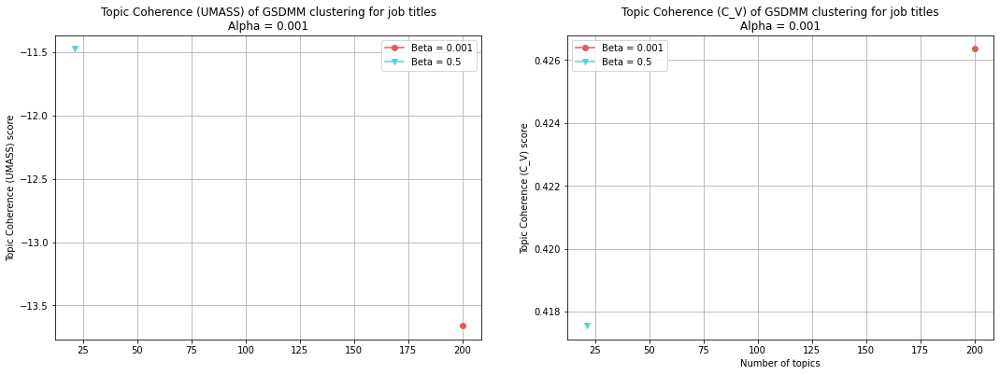

<ipython-input-100-19aabe8decf3>:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax1 = plt.subplot(1, 2, 1)
<ipython-input-100-19aabe8decf3>:33: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax2 = plt.subplot(1, 2, 2)


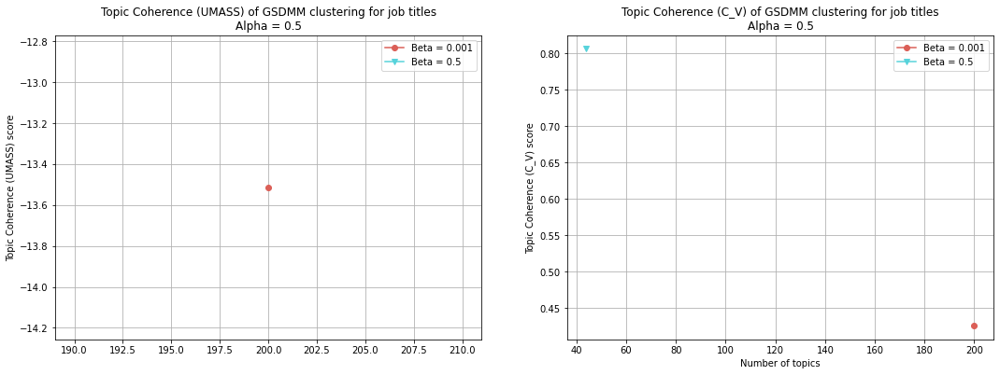

In [100]:
palette = sns.color_palette("hls", n_colors=len(beta_range))

# The higher the better

for ida, alpha in enumerate(alpha_range):
    fig = plt.figure(figsize=(18, 6))
    for idx, beta in enumerate(beta_range):
        # Plot UMASS coherence
        ax1 = plt.subplot(1, 2, 1)
        ax1.plot(
            tuning_result_df["n_clusters"].loc[
                (tuning_result_df["beta"] == beta)
                & (tuning_result_df["alpha"] == alpha)
            ],
            evaluation_result_df["coherence_umass"].loc[
                (tuning_result_df["beta"] == beta)
                & (tuning_result_df["alpha"] == alpha)
            ],
            label="Beta = " + str(beta),
            color=palette[idx],
            marker=marker_list[idx],
        )
        ax1.set_ylabel("Topic Coherence (UMASS) score")
        # plt.xticks(np.unique(model_result_df["min_samples"]))
        ax1.set_title(
            "Topic Coherence (UMASS) of GSDMM clustering for job titles\n"
            + "Alpha = "
            + str(alpha)
        )
        ax1.legend(loc="best")

        # Plot C_V coherence
        ax2 = plt.subplot(1, 2, 2)
        ax2.plot(
            tuning_result_df["n_clusters"].loc[
                (tuning_result_df["beta"] == beta)
                & (tuning_result_df["alpha"] == alpha)
            ],
            evaluation_result_df["coherence_cv"].loc[
                (tuning_result_df["beta"] == beta)
                & (tuning_result_df["alpha"] == alpha)
            ],
            label="Beta = " + str(beta),
            color=palette[idx],
            marker=marker_list[idx],
        )
        ax2.set_ylabel("Topic Coherence (C_V) score")
        # plt.xticks(np.unique(model_result_df["min_samples"]))
        ax2.set_title(
            "Topic Coherence (C_V) of GSDMM clustering for job titles\n"
            + "Alpha = "
            + str(alpha)
        )
        ax2.set_xlabel("Number of topics")
        # plt.yticks(np.unique(model_result_df["number_clusters"]))

        ax2.legend(loc="best")
    ax1.grid()
    ax2.grid()

    # Saving plot as image
    fig.savefig(
        RESULT_DIR
        + "gsdmm/"
        + "title_gsdmm_coherence_alpha-"
        + str(alpha)
        + "_plot.png",
        #     bbox_inches="tight",
        #     dpi=150,
    )

    # Show plot
    plt.show()

In [ ]:
# def get_average_score(models, docs):
#     avg_score_list = []
#     for model in models:
#         score_list = []
#         for doc in docs:
#             score = model.score(doc)
#             score_list.append(score)
# #             print(score_list)
#             avg_score = np.mean(score_list)
# #             print(avg_score)
#         avg_score_list.append(avg_score)
#     return avg_score_list

In [43]:
# # Create average score
# avg_scores = get_average_score(model_list, title_docs)
# # print(avg_scores)
# model_result['Average Score'] = avg_scores

In [44]:
# def coherence_measure(title_corpus, numDocuments, nTopics, selected_topics):
#     # Build corpus
#     id2word = Dictionary(title_corpus)
#     corpus1 = [id2word.doc2bow(doc) for doc in title_corpus]
#     # print('corpus1:', len(corpus1), corpus1[:5])
#     corpus = compute_topic_coherence.build_corpus(corpus1=corpus1, N=20)

#     # Retrieve word counts per topic
#     topicWordCount = compute_topic_coherence.getTopicWordCount(nTopics=nTopics, id2word=id2word, numDocuments=numDocuments, corpus=corpus)
#     # print('topicWordCount:', len(topicWordCount), len(topicWordCount[0]), topicWordCount[0][:5])

#     # Retrieve top words per topic
#     coherence_index_all, coherence_word_all = compute_topic_coherence.getTopTopicalWords(selected_topics=selected_topics, topicWordCount=topicWordCount, id2word=id2word, twords=10)
#     # print('coherence_word_all:', len(coherence_word_all), len(coherence_word_all[0]), coherence_word_all[0][:5])
#     # print('coherence_index_all:', len(coherence_index_all), len(coherence_index_all[0]), coherence_index_all[0][:5])

#     # Compute coherence score:
#     coherence_score = compute_topic_coherence.coherence(corpus=corpus, coherence_index_all=coherence_index_all, nTopics=nTopics)

#     return coherence_score, coherence_index_all, coherence_word_all, topicWordCount

In [45]:
# # Compute coherence score for each topic model in list
# coherence_score_list = []
# coherence_index_list = []
# coherence_word_list = []
# topicWordCount_list = []
# numDocuments = len(title_docs)

# pbar = tqdm(desc="Compute coherence score", total=len(labels_list))
# for i in range(len(labels_list)):
#     selected_topics = np.unique(labels_list[i])
#     # print('selected_topics', selected_topics)
#     nTopics = len(selected_topics)
#     pbar.set_description("Compute coherence score of model " + str(i) + " with " + str(nTopics+1) + " topics")
#     coherence_score, coherence_index_all, coherence_word_all, topicWordCount = coherence_measure(title_corpus, numDocuments, nTopics, selected_topics)
#     coherence_score_list.append(coherence_score)
#     coherence_index_list.append(coherence_index_all)
#     coherence_word_list.append(coherence_word_all)
#     topicWordCount_list.append(topicWordCount)
#     pbar.update(1)
# pbar.close()

In [46]:
# coherence_score_list

In [101]:
# Select the GSDMM model with optimal number of clusters
best_index = np.argmax(evaluation_result_df["coherence_cv"].values)
# best_index = int(
#     np.where(
#         (np.array(tuning_result["alpha"]) == 0.001)
#         & (np.array(tuning_result["beta"]) == 0.001)
#         & (np.array(tuning_result["n_topics"]) == 25)
#     )[0]
# )
print("Index of best coherence score", best_index)
best_n_clusters = tuning_result_df["n_clusters"][best_index]
best_alpha = tuning_result_df["alpha"][best_index]
best_beta = tuning_result_df["beta"][best_index]

print(
    f"Optimal number of clusters = {n_clusters}, best alpha = {best_alpha}, best beta = {best_beta}"
)

Index of best coherence score 3
Optimal number of clusters = 44, best alpha = 0.5, best beta = 0.5


In [50]:
# # Plot the number of cluster during training passes
# plt.figure(figsize=(18, 5))
# for idb, b in enumerate(beta_range):
#     plot_df = training_df.loc[training_df["beta"] == b]
#     plt.subplot(1, len(beta_range), idb+1)
#     for ida, a in enumerate(alpha_range):
#         plt.plot(
#             plot_df["pass"].loc[plot_df["alpha"] == a],
#             plot_df["number_clusters"].loc[plot_df["alpha"] == a],
#             label=f"Alpha = {a}",
#         )
#     plt.title(
#         "GSDMM clustering \n"
#         + "Beta = " + str(b)
#     )
#     plt.legend(loc="best")
#     plt.xlabel("Pass")
# #     plt.xticks(np.unique(training_df['pass']))
#     plt.ylabel("Number of clusters")
#     plt.grid()
# plt.show()

In [51]:
# # Select best model base on Silhouette score
# best_index = np.argmax(model_result_df["Silhouette"])
# # best_n = len(np.unique(labels_list[best_index]))
# # best_model = model_list[best_index]
# # best_labels = labels_list[best_index]
# best_params = model_result_df.iloc[best_index]
# best_index, best_params

In [52]:
# model_result_df['K'][best_index]

In [53]:
# best_model, best_labels = build_mgp_model(
#     X=title_docs,
#     corpus=title_corpus,
#     vocab_size=len(title_vocab),
#     K=model_result_df['K'][best_index],
#     alpha=model_result_df['alpha'][best_index],
#     beta=model_result_df['beta'][best_index],
#     n_iters=10,
#     seed=SEED,
# )

In [54]:
# best_n = len(np.unique(best_labels))
# best_n

In [55]:
# selected_topics = np.unique(best_labels)
# # print('selected_topics', selected_topics)
# nTopics = len(selected_topics)
# coherence_score, coherence_index_all, coherence_word_all, topicWordCount = coherence_measure(title_corpus, numDocuments, nTopics, selected_topics)
# coherence_score

In [109]:
X = title_embeddings
best_labels = label_list[best_index]
model_validation = {
    "n_clusters": [best_n_clusters],
    "alpha": [best_alpha],
    "beta": [best_alpha],
}

In [110]:
model_validation["silhouette"] = []
model_validation["silhouette_error"] = []

try:
    silhouette = metrics.silhouette_score(
        X, best_labels, sample_size=10000, random_state=SEED, n_jobs=-1
    )
    model_validation["silhouette_error"].append("None")
except Exception as e:
    print(e)
    silhouette = -1.1
    model_validation["silhouette_error"].append(e)
model_validation["silhouette"].append(silhouette)

In [111]:
model_validation["calinski_harabasz"] = []
model_validation["calinski_harabasz_error"] = []

try:
    calinski_harabasz = metrics.calinski_harabasz_score(X, best_labels)
    model_validation["calinski_harabasz_error"].append("None")
except Exception as e:
    print(e)
    calinski_harabasz = -1.1
    model_validation["calinski_harabasz_error"].append(e)
model_validation["calinski_harabasz"].append(calinski_harabasz)

In [112]:
model_validation["davies_bouldin"] = []
model_validation["davies_bouldin_error"] = []

try:
    davies_bouldin = metrics.davies_bouldin_score(X, best_labels)
    model_validation["davies_bouldin_error"].append("None")
except Exception as e:
    print(e)
    davies_bouldin = -1.1
    model_validation["davies_bouldin_error"].append(e)
model_validation["davies_bouldin"].append(davies_bouldin)

In [113]:
model_validation["silhouette_corr"] = []
model_validation["silhouette_corr_error"] = []

try:
    silhouette = metrics.silhouette_score(
        X,
        best_labels,
        sample_size=10000,
        random_state=SEED,
        n_jobs=-1,
        metric="correlation",
    )
    model_validation["silhouette_corr_error"].append("None")
except Exception as e:
    print(e)
    silhouette = -1.1
    model_validation["silhouette_corr_error"].append(e)
model_validation["silhouette_corr"].append(silhouette)

In [114]:
# Display validation results
model_validation_df = pd.DataFrame(model_validation)
model_validation_df

,n_clusters,alpha,beta,silhouette,silhouette_error,calinski_harabasz,calinski_harabasz_error,davies_bouldin,davies_bouldin_error,silhouette_corr,silhouette_corr_error
0,44,0.5,0.5,-0.088814,None,85.25267,None,2.384783,None,0.0,None


In [115]:
# Save tuning results
model_validation_df.to_csv(
    RESULT_DIR + "gsdmm/" + "title_gsdmm_model_validation.csv", index=False
)

In [63]:
pca_datapoint = np.load(OUTPUT_DIR + "visualization/" + "title_pca_datapoints.npy")
umap_datapoint = np.load(OUTPUT_DIR + "visualization/" + "title_umap_datapoints.npy")
tsne_datapoint = np.load(OUTPUT_DIR + "visualization/" + "title_tsne_datapoints.npy")

Start PCA 2021-05-20 22:47:58.453917
End PCA 2021-05-20 22:47:58.466915
PCA duration 0:00:00.012998

Start t-SNE 2021-05-20 22:47:58.467920
End t-SNE 2021-05-20 22:47:58.498920
t-SNE duration 0:00:00.031000

Start UMAP 2021-05-20 22:47:58.498920
End UMAP 2021-05-20 22:47:58.511924
UMAP duration 0:00:00.013004



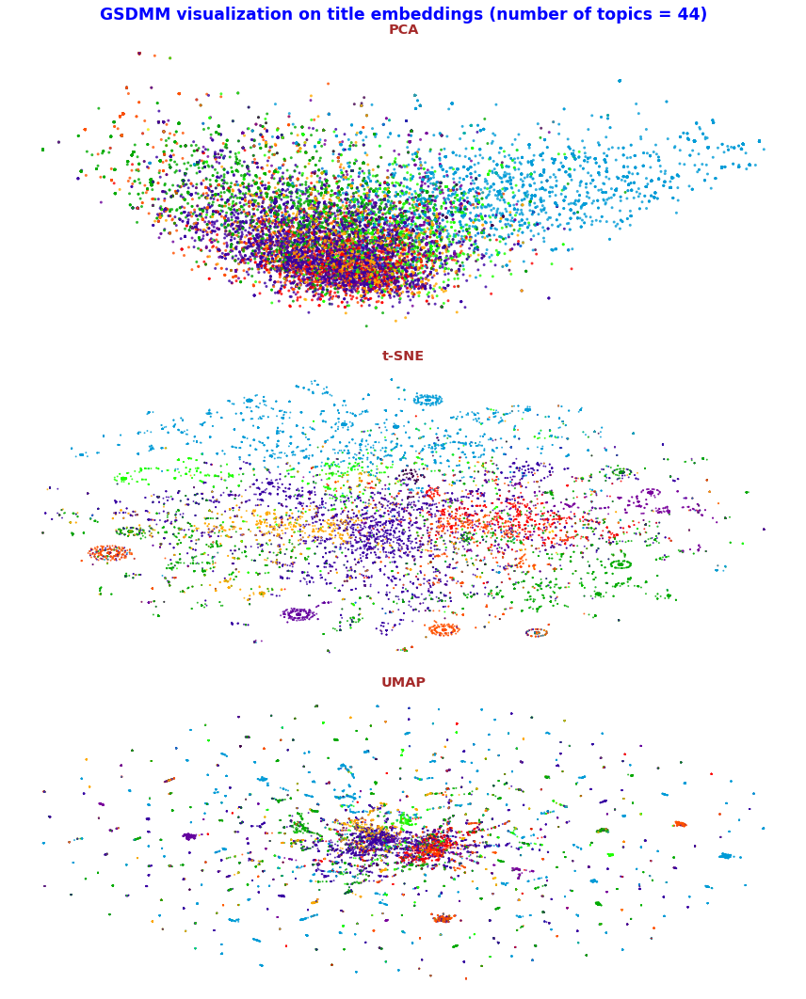

In [116]:
plot_title = (
    "GSDMM visualization on title embeddings (number of topics = "
    + str(best_n_clusters)
    + ")"
)
palette = sns.color_palette("nipy_spectral", as_cmap=True)
plot_filename = (
    RESULT_DIR + "gsdmm/" + "title_gsdmm_optimal-cluster-visualization.png"
)
palette = sns.color_palette("nipy_spectral", as_cmap=True)
# colors = cm.nipy_spectral(best_labels.astype(float) / best_k)
colors = best_labels

# Visualize clusters with PCA, UMAP, and t-SNE
visualize_cluster(
    plot_title,
    (12, 15),
    colors,
    palette,
    4,
    pca_datapoint,
    tsne_datapoint,
    umap_datapoint,
    pca=True,
    tsne=True,
    compute_umap=True,
    save_plots=True,
    plot_file=plot_filename,
)

## Display top words of each cluster

In [117]:
df_clusters = title_docs.copy(deep=True)
df_clusters["model_type"] = "gsdmm"
df_clusters["title_n_clusters"] = best_n_clusters
# df_clusters["embeddings"] = "job_title"
df_clusters['title_cluster_label'] = best_labels
df_clusters

,job_id,job_title,job_title_lemma,job_title_token,model_type,title_n_clusters,title_cluster_label
0,1,Chief Financial Officer,chief financial officer,"[chief, financial, officer]",gsdmm,44,26
1,2,Full-time Community Connections Intern (paid i...,time community connection intern pay internship,"[time, community, connection, intern, pay, int...",gsdmm,44,169
2,3,Country Coordinator,country coordinator,"[country, coordinator]",gsdmm,44,94
3,4,BCC Specialist,bcc specialist,"[bcc, specialist]",gsdmm,44,26
4,5,Software Developer,software developer,"[software, developer]",gsdmm,44,61
...,...,...,...,...,...,...,...
18987,18997,Senior Creative UX/ UI Designer,senior creative ux ui designer,"[senior, creative, ux, ui, designer]",gsdmm,44,61
18988,18998,Category Development Manager,category development manager,"[category, development, manager]",gsdmm,44,155
18989,18999,Operational Marketing Manager,operational marketing manager,"[operational, marketing, manager]",gsdmm,44,26
18990,19000,Head of Online Sales Department,head online sale department,"[head, online, sale, department]",gsdmm,44,26


In [118]:
wordcount = {}
sorted_wordcount = {}
for i in np.unique(label_list[best_index]):
    titles = df_clusters[df_clusters["title_cluster_label"] == i][
        "job_title_lemma"
    ].values
    titles = " ".join(" ".join(titles).split())
    wordcount[i] = {}
    for j in titles.split():
        if j in wordcount[i]:
            wordcount[i][j] += 1
        else:
            wordcount[i][j] = 1
    sorted_wordcount[i] = sorted(wordcount[i].items(), key=lambda x: x[1], reverse=True)

In [119]:
topwords = {}
for key, i in sorted_wordcount.items():
    print("Cluster "+str(key)+": ", end='')
    topwords[key] = ''
    for newkey, j in sorted_wordcount[key][:10]:
        print(newkey + '|', end='')
        topwords[key] = topwords[key] + newkey + '|'
    print()

Cluster 0: copywriter|
Cluster 6: assurance|quality|engineer|software|specialist|tester|revenue|senior|analyst|fraud|
Cluster 13: lobby|ambassador|concierge|
Cluster 20: educational|information|fair|administrative|assistant|civic|civil|data|managment|analist|
Cluster 21: language|english|translator|course|interpreter|teacher|editor|specialist|instructor|armenian|
Cluster 22: human|resource|department|head|specialist|policy|financial|economist|management|unit|
Cluster 23: medical|representative|yerevan|doctor|armenia|tb|gyumri|sale|mobile|journalist|
Cluster 26: specialist|manager|officer|marketing|department|head|senior|financial|project|analyst|
Cluster 27: short|term|local|penitentiary|healthcare|armenia|lot|consultancy|service|consultant|
Cluster 34: grafik|interior|exterior|designer|activity|examiner|animation|
Cluster 45: student|forum|lecture|swedish|equal|opportunity|ombudsman|conference|debate|april|
Cluster 48: instructor|bank|legislation|
Cluster 49: coop|tech|precision|analo

In [120]:
best_topics = distribution_dict["n_z_w"][best_index]
sorted_wordcount2 = {}
for i in np.unique(label_list[best_index]):
    sorted_wordcount2[i] = sorted(
        best_topics[i].items(), key=lambda x: x[1], reverse=True
    )

In [121]:
topwords2 = {}
for key, i in sorted_wordcount2.items():
    print("Cluster "+str(key)+": ", end='')
    topwords2[key] = ''
    for newkey, j in sorted_wordcount2[key][:10]:
        print(newkey + '|', end='')
        topwords2[key] = topwords2[key] + newkey + '|'
    print()

Cluster 0: copywriter|
Cluster 6: assurance|quality|engineer|software|specialist|tester|revenue|senior|analyst|fraud|
Cluster 13: lobby|ambassador|concierge|
Cluster 20: educational|information|fair|administrative|assistant|civic|civil|data|managment|analist|
Cluster 21: language|english|translator|course|interpreter|teacher|editor|specialist|instructor|armenian|
Cluster 22: human|resource|department|head|specialist|policy|financial|economist|management|unit|
Cluster 23: medical|representative|yerevan|doctor|armenia|gyumri|tb|sale|mobile|journalist|
Cluster 26: specialist|manager|officer|marketing|department|head|senior|financial|project|analyst|
Cluster 27: armenia|short|term|local|penitentiary|healthcare|lot|service|consultancy|consultant|
Cluster 34: grafik|interior|exterior|designer|activity|examiner|animation|
Cluster 45: lecture|swedish|equal|opportunity|ombudsman|student|forum|conference|debate|april|
Cluster 48: instructor|bank|legislation|
Cluster 49: design|coop|tech|precisio

## Save cluster results to file

In [122]:
df_clusters.to_csv(
    RESULT_DIR + "gsdmm/" + "title_gsdmm_optimal-cluster-labels.csv", index=False
)

In [123]:
# Save tuple of model sets
pickle.dump(
    (sorted_wordcount, topwords, sorted_wordcount2, topwords2, best_topics),
    open(RESULT_DIR + "gsdmm/" + "title_gsdmm_optimal-topwords.pkl", "wb"),
)